In [1]:
import numpy as np
import matplotlib.pyplot as plt
import desc.io
from desc.grid import LinearGrid, ConcentricGrid
from desc.objectives import (
    ObjectiveFunction,
    FixBoundaryR,
    FixBoundaryZ,
    FixPressure,
    FixCurrent,
    FixIota,
    FixPsi,
    AspectRatio,
    ForceBalance,
    QuasisymmetryTwoTerm,
    RotationalTransform
)
from desc.optimize import Optimizer
from desc.plotting import (
    plot_grid,
    plot_boozer_modes,
    plot_boozer_surface,
    plot_qs_error,
    plot_boundaries,
    plot_boundary,
    plot_3d
)

from desc.equilibrium import Equilibrium
from desc.geometry import FourierRZToroidalSurface
from desc.profiles import PowerSeriesProfile

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


DESC version 0+untagged.9470.gaf75d5a.dirty,using JAX backend, jax version=0.4.28, jaxlib version=0.4.28, dtype=float64
Using device: CPU, with 3.66 GB available memory


In [2]:
eq_fam = desc.io.load("inputs/nfp2_QA.h5")
eq_init = eq_fam[-1]
eq_qs = eq_init.copy()

In [3]:
optimizer = Optimizer("lsq-exact")

grid_vol = LinearGrid(
    M=eq_qs.M_grid,
    N=eq_qs.N_grid,
    NFP=eq_qs.NFP,
    rho=np.arange(0.1,1.1,0.1),
    sym=eq_qs.sym
)

In [4]:
for maxMode in range(1,2):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    
    objective_f = ObjectiveFunction((
        AspectRatio(eq=eq_qs, target=6, weight=1),
        #FixPressure(eq=eq_qs, weight=constWeight),
        #FixCurrent(eq=eq_qs, weight=constWeight),
        #FixPsi(eq=eq_qs, weight=constWeight),
        ForceBalance(eq=eq_qs, weight=10),
    ))

    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=20,
        options={}
    )


Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 890 ms
Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 1.01 sec
Timer: Objective build = 4.64 sec
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 2.01 sec
Timer: Linear constraint projection build = 3.75 sec
Number of parameters: 155
Number of objectives: 1051
Starting optimization
Using method: lsq-exact
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1          5.000e-01                                    1.003e+01   
       1              2          4.875e-01      1.254e-02

In [5]:
print(result.x.shape, result.allx[-1].shape)
print(objective_f.compute_scalar(result.allx[-1]))
# print(result.allx[-1])
x_temp = np.array(result.allx[-1])
# print(x_temp)
x_temp[np.abs(x_temp) < 1e-8] = 0.0
print(x_temp[np.abs(x_temp) > 1e-6])
print(objective_f.compute_scalar(x_temp))

(155,) (363,)
5.39360375034122e-10
[ 9.97229044e-01  1.62945736e-01  2.75053058e-03  1.33794983e-04
  2.04253447e-05 -1.70541109e-01 -4.74498002e-05  2.08420607e-04
  4.74498002e-05 -9.62914894e-02  7.00392374e-03 -1.23141674e-05
 -5.32241203e-04 -9.34909176e-06  8.30000000e-02  9.94498939e-01
  1.00000000e+00  1.63079531e-01 -1.70332688e-01]
5.393902132308674e-10


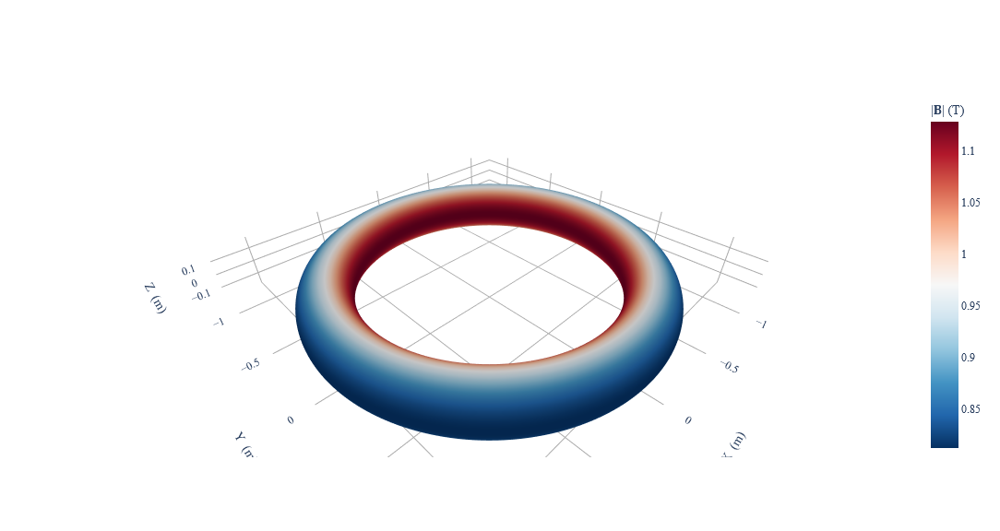

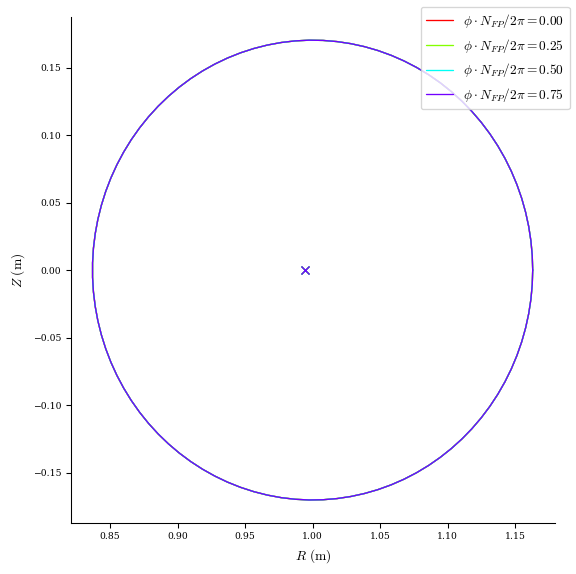

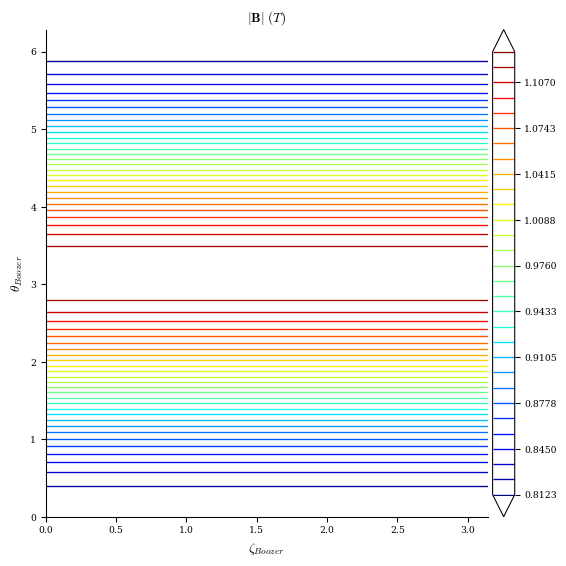

In [6]:
plot_boundary(eq_qs, figsize=(6,6))
plot_boozer_surface(eq_qs, figsize=(6,6))
plot_3d(eq_qs, "|B|", figsize=(6,6))

In [7]:
eq_qs = eq_init.copy()
objective_f = ObjectiveFunction((
#     AspectRatio(eq=eq_qs, target=6, weight=1),
    #FixPressure(eq=eq_qs, weight=constWeight),
    #FixCurrent(eq=eq_qs, weight=constWeight),
    #FixPsi(eq=eq_qs, weight=constWeight),
    ForceBalance(eq=eq_qs, weight=10),
))
optimizer = Optimizer("Turbo1")

for maxMode in range(1,2):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    global_eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=1000,
        options={"trust_regions":1, "box_size":1e-1, "training_steps": 100, "batch_size":200}
    )

Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 524 ms
Timer: Objective build = 729 ms
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 1.09 sec
Timer: Linear constraint projection build = 1.86 sec
Number of parameters: 155
Number of objectives: 1050
Starting optimization
Using method: Turbo1
ub - lb 0.16971082250504776 2.001108056408729e-12 0.006785850050820235
lb [ 8.93317836e-07  1.89788356e-07 -2.21638842e-09 -8.00174081e-08
 -6.63927081e-07  1.34202828e-07 -7.85759148e-10 -6.65497749e-07
 -8.01524969e-08 -9.90191647e-10  3.75863578e-02  8.45472281e-09
  3.75873104e-02 -1.12527765e-01 -1.32456825e-08  3.75863563e-02
 -1.12527

In [8]:
print(objective_f.compute_scalar(result.allx[np.argmin(result.allfun)]))
print(np.shape(result.x), np.shape(result.allx[-1]), np.shape(result.allx))
print(result.allx[0][np.abs(result.allx[0]) > 1e-6])
print(result.allx[-1][np.abs(result.allx[-1]) > 1e-6])

25.987783945664745
(155,) (363,) (1310, 363)
[ 4.24619197e-03  2.65166949e-03 -4.24619197e-03 -2.65166949e-03
  3.94074203e-03  1.05128332e-03 -3.94074203e-03 -1.05128332e-03
  2.94604907e-03  5.26503172e-03 -2.94604907e-03 -5.26503172e-03
 -1.46242547e-03  1.79101610e-05  1.46242547e-03 -1.79101610e-05
  3.34993494e-04 -2.20148609e-06 -1.67499767e-04  2.20148609e-06
  9.86311256e-01  2.06777489e-01 -1.86633489e-02 -2.07135658e-03
 -6.04279606e-03  3.23520929e-02  2.07135658e-03  2.25759953e-06
 -2.51198249e-05 -1.49685140e-06  1.63233261e-03 -1.22133270e-03
 -4.10999919e-04  2.17953329e-02 -1.39571739e-06 -2.30585569e-03
 -2.17953329e-02  2.30585569e-03 -4.87269785e-03 -1.51444311e-03
  2.53691619e-06  6.38714096e-03 -2.53691619e-06 -2.78021678e-02
  2.87480149e-03  7.42164030e-04 -2.64493455e-06 -2.87480149e-03
  2.70600038e-02  2.64493455e-06  5.33853211e-05 -5.33853211e-05
 -1.95437344e-03  2.78539421e-05  9.54504064e-04  1.92651950e-03
 -9.54504064e-04 -4.26915923e-03  4.26915923e

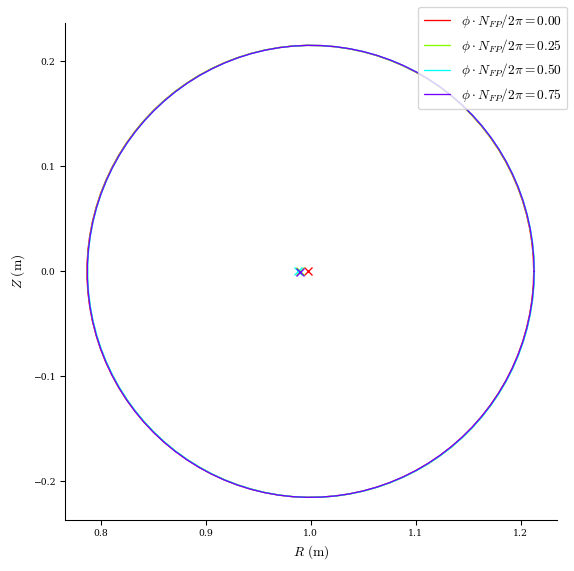

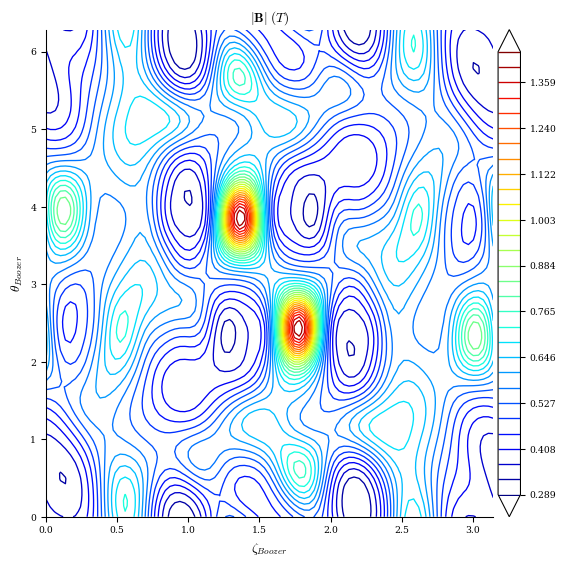

In [9]:
plot_boundary(global_eq_qs, figsize=(6,6))
plot_boozer_surface(global_eq_qs, figsize=(6,6))
plot_3d(global_eq_qs, "|B|", figsize=(6,6))

In [10]:
objective_f.print_value(result.allx[np.argmin(result.allfun)])

Total (sum of squares):  2.599e+01, 
Maximum absolute Force error:  2.724e+05 (N)
Minimum absolute Force error:  1.480e+01 (N)
Average absolute Force error:  1.248e+04 (N)
Maximum absolute Force error:  1.987e-01 (normalized)
Minimum absolute Force error:  1.080e-05 (normalized)
Average absolute Force error:  9.105e-03 (normalized)
